In [1]:
import pandas as pd 
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree 
from sklearn.model_selection import train_test_split , GridSearchCV
from sklearn.metrics import accuracy_score , confusion_matrix , roc_auc_score , roc_curve
from pandas_profiling import ProfileReport

In [2]:
df=pd.read_csv(r'C:\Users\pbann\OneDrive\Desktop\science\data set\winequality-red.csv')

In [3]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [4]:
set(df.quality)

{3, 4, 5, 6, 7, 8}

In [5]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/25 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [7]:
x = df.drop(columns='quality')

In [8]:
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1591,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1592,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1593,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1594,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [9]:
y = df.quality

In [10]:
y

0       5
1       5
2       5
3       6
4       5
       ..
1591    5
1592    6
1593    6
1594    5
1595    6
Name: quality, Length: 1596, dtype: int64

In [11]:
x_train , x_test, y_train,y_test = train_test_split(x,y,test_size = .25,random_state = 30)

In [12]:
x_train

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1378,6.8,0.83,0.09,1.80,0.074,4.0,25.0,0.99534,3.38,0.45,9.6
1086,11.6,0.41,0.54,1.50,0.095,22.0,41.0,0.99735,3.02,0.76,9.9
161,7.4,0.60,0.26,7.30,0.070,36.0,121.0,0.99820,3.37,0.49,9.4
109,7.8,0.56,0.19,1.80,0.104,12.0,47.0,0.99640,3.19,0.93,9.5
959,6.6,0.57,0.02,2.10,0.115,6.0,16.0,0.99654,3.38,0.69,9.5
...,...,...,...,...,...,...,...,...,...,...,...
919,8.4,0.62,0.12,1.80,0.072,38.0,46.0,0.99504,3.38,0.89,11.8
1164,8.2,0.33,0.39,2.50,0.074,29.0,48.0,0.99528,3.32,0.88,12.4
500,10.4,0.44,0.73,6.55,0.074,38.0,76.0,0.99900,3.17,0.85,12.0
941,8.3,0.30,0.49,3.80,0.090,11.0,24.0,0.99498,3.27,0.64,12.1


In [13]:
x_test

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1201,7.2,0.36,0.46,2.1,0.074,24.0,44.0,0.99534,3.40,0.85,11.0
1074,8.6,0.37,0.65,6.4,0.080,3.0,8.0,0.99817,3.27,0.58,11.0
1034,7.3,0.91,0.10,1.8,0.074,20.0,56.0,0.99672,3.35,0.56,9.2
511,10.5,0.51,0.64,2.4,0.107,6.0,15.0,0.99730,3.09,0.66,11.8
1471,9.9,0.50,0.50,13.8,0.205,48.0,82.0,1.00242,3.16,0.75,8.8
...,...,...,...,...,...,...,...,...,...,...,...
494,7.8,0.52,0.25,1.9,0.081,14.0,38.0,0.99840,3.43,0.65,9.0
591,9.9,0.49,0.58,3.5,0.094,9.0,43.0,1.00040,3.29,0.58,9.0
1567,6.4,0.36,0.53,2.2,0.230,19.0,35.0,0.99340,3.37,0.93,12.4
769,9.5,0.57,0.27,2.3,0.082,23.0,144.0,0.99782,3.27,0.55,9.4


In [14]:
dt_model = DecisionTreeClassifier()

In [15]:
dt_model.fit(x_train, y_train)

DecisionTreeClassifier()

In [16]:
import sklearn
import  matplotlib.pyplot as plt
from sklearn import tree
%matplotlib inline 

In [17]:
sklearn.__version__

'0.24.2'

[Text(494.67777563820425, 1058.5894736842106, 'X[10] <= 9.925\ngini = 0.634\nsamples = 1197\nvalue = [5, 38, 521, 481, 142, 10]'),
 Text(234.44688050176057, 1001.3684210526317, 'X[6] <= 98.5\ngini = 0.481\nsamples = 518\nvalue = [2, 17, 343, 146, 10, 0]'),
 Text(150.5979863556338, 944.1473684210526, 'X[9] <= 0.575\ngini = 0.518\nsamples = 443\nvalue = [2, 16, 271, 144, 10, 0]'),
 Text(55.136883802816904, 886.9263157894737, 'X[8] <= 3.225\ngini = 0.42\nsamples = 185\nvalue = [1, 12, 136, 35, 1, 0]'),
 Text(19.647887323943664, 829.7052631578947, 'X[6] <= 11.0\ngini = 0.213\nsamples = 59\nvalue = [0, 1, 52, 6, 0, 0]'),
 Text(15.71830985915493, 772.4842105263158, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 0, 2, 0, 0]'),
 Text(23.577464788732396, 772.4842105263158, 'X[6] <= 96.5\ngini = 0.163\nsamples = 57\nvalue = [0, 1, 52, 4, 0, 0]'),
 Text(19.647887323943664, 715.2631578947369, 'X[10] <= 9.65\ngini = 0.135\nsamples = 56\nvalue = [0, 1, 52, 3, 0, 0]'),
 Text(7.859154929577465, 658.04210526

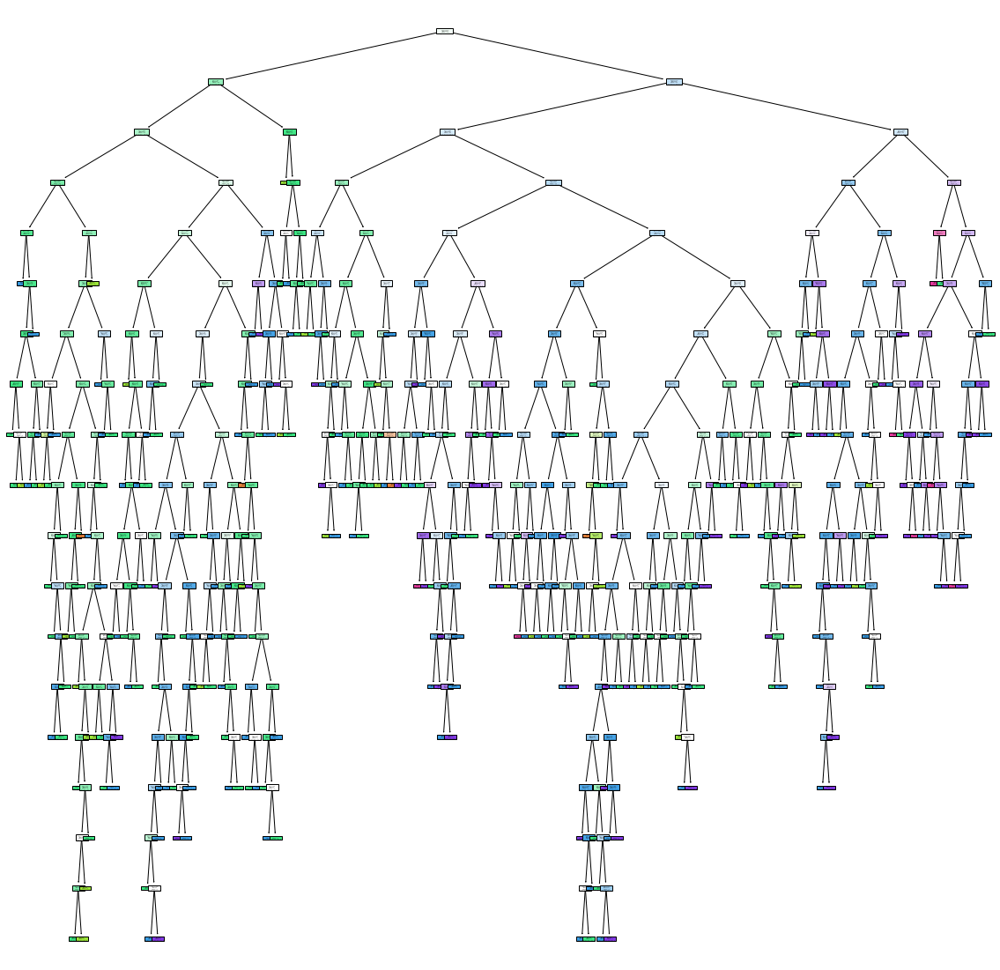

In [18]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model,filled=True)

In [19]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1591,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1592,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1593,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1594,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [20]:
df1 = df.head(500)

In [21]:
x1 = df1.drop(columns='quality')

In [22]:
y1 = df1.quality

In [23]:
dt_model1 = DecisionTreeClassifier()
dt_model1.fit(x1,y1)

DecisionTreeClassifier()

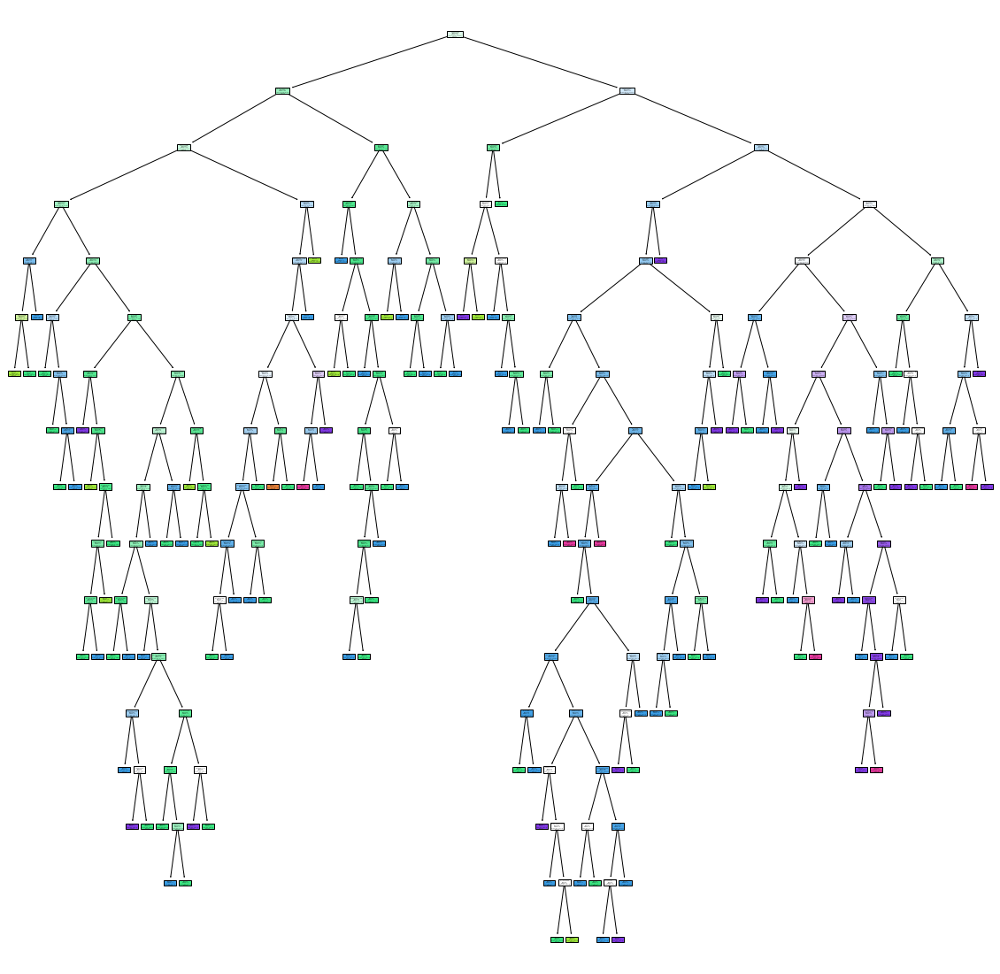

In [24]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model1,filled=True, class_names=[str(i) for i in set(y1)] ,feature_names=x1.columns)
plt.savefig('dt_model_1')

In [25]:
y1

0      5
1      5
2      5
3      6
4      5
      ..
495    5
496    8
497    6
498    6
499    7
Name: quality, Length: 500, dtype: int64

In [26]:
[str(i) for i in set(y1)]

['3', '4', '5', '6', '7', '8']

In [27]:
set(y1)

{3, 4, 5, 6, 7, 8}

In [28]:
df1

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.90,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.60,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.30,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.90,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.90,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
495,7.2,0.34,0.32,2.50,0.090,43.0,113.0,0.9966,3.32,0.79,11.1,5
496,10.7,0.35,0.53,2.60,0.070,5.0,16.0,0.9972,3.15,0.65,11.0,8
497,8.7,0.69,0.31,3.00,0.086,23.0,81.0,1.0002,3.48,0.74,11.6,6
498,7.8,0.52,0.25,1.90,0.081,14.0,38.0,0.9984,3.43,0.65,9.0,6


In [29]:
dt_model1.predict(x1)

array([5, 5, 5, 6, 5, 5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 7, 5, 4, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6, 5, 6, 5, 6, 5, 6, 6, 7, 4, 5, 5, 4, 6, 5,
       5, 4, 5, 5, 5, 5, 5, 6, 6, 5, 6, 5, 5, 5, 5, 6, 5, 5, 7, 5, 5, 5,
       5, 5, 5, 6, 6, 5, 5, 4, 5, 5, 5, 6, 5, 4, 5, 5, 5, 5, 6, 5, 6, 5,
       5, 5, 5, 5, 5, 4, 6, 5, 5, 5, 6, 6, 6, 6, 5, 5, 5, 5, 5, 6, 5, 5,
       5, 5, 6, 5, 6, 6, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5, 5, 7, 5, 5, 5, 5,
       6, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 6, 5, 5, 5, 6, 6, 6, 5, 5, 5, 5,
       5, 5, 5, 6, 5, 4, 6, 5, 5, 5, 5, 4, 6, 5, 4, 6, 6, 6, 5, 5, 5, 6,
       5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 5, 6, 5, 5, 5, 5, 5, 6, 7, 4,
       7, 5, 5, 5, 6, 7, 7, 5, 5, 7, 6, 6, 6, 5, 6, 5, 5, 5, 5, 5, 6, 5,
       5, 6, 4, 6, 6, 5, 6, 5, 7, 6, 6, 5, 6, 6, 6, 6, 6, 6, 5, 6, 6, 7,
       7, 6, 5, 5, 6, 6, 6, 6, 5, 5, 6, 5, 5, 5, 5, 7, 5, 4, 5, 5, 5, 7,
       4, 8, 6, 6, 6, 6, 5, 5, 5, 6, 6, 6, 8, 7, 6, 7, 5, 7, 5, 5, 6, 6,
       7, 5, 7, 5, 6, 6, 6, 5, 5, 5, 5, 5, 6, 6, 5,

In [30]:
dt_model1.score(x1,y1)

1.0

In [31]:
dt_model1.score(x_test, y_test)

0.5639097744360902

In [34]:
path

{'ccp_alphas': array([0.        , 0.00178571, 0.00181818, 0.00185   , 0.00191304,
        0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
        0.002     , 0.002     , 0.00252874, 0.00261111, 0.00262769,
        0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
        0.00266667, 0.00266667, 0.00266667, 0.003     , 0.003     ,
        0.003     , 0.00308418, 0.0032    , 0.0032    , 0.00328205,
        0.00333333, 0.00333333, 0.00333333, 0.00333333, 0.00334032,
        0.00336606, 0.00348046, 0.00351398, 0.0036    , 0.00366667,
        0.00366667, 0.00366667, 0.00367391, 0.00375   , 0.00377778,
        0.0038    , 0.0038237 , 0.00392599, 0.004     , 0.00452121,
        0.00465709, 0.00466667, 0.00480769, 0.00481818, 0.00492465,
        0.00495726, 0.00533333, 0.00537662, 0.00539577, 0.00547368,
        0.00554472, 0.00558545, 0.00563716, 0.00598397, 0.00630156,
        0.00672222, 0.00678788, 0.00684649, 0.00688889, 0.00701299,
        0.00858654, 0.00889873, 0.

In [35]:
path = dt_model1.cost_complexity_pruning_path(x1,y1)
ccp_alpha = path.ccp_alphas

In [36]:
ccp_alpha

array([0.        , 0.00166667, 0.00181818, 0.00191304, 0.002     ,
       0.002     , 0.002     , 0.002     , 0.002     , 0.002     ,
       0.00203333, 0.00252874, 0.00261111, 0.00262769, 0.00266667,
       0.00266667, 0.00266667, 0.00266667, 0.00266667, 0.00266667,
       0.00266667, 0.00266667, 0.003     , 0.003     , 0.003     ,
       0.00308418, 0.0032    , 0.0032    , 0.0032    , 0.00327273,
       0.00328205, 0.00333333, 0.00333333, 0.00333333, 0.00333333,
       0.00334032, 0.00336606, 0.00348046, 0.00351398, 0.00366667,
       0.00366667, 0.00367391, 0.00369231, 0.00375   , 0.00377778,
       0.0038    , 0.0038237 , 0.00392599, 0.004     , 0.00452121,
       0.00465709, 0.00466667, 0.00480769, 0.00481818, 0.00495726,
       0.00533333, 0.00537662, 0.00547368, 0.00558545, 0.00563716,
       0.00592861, 0.00598397, 0.00630156, 0.00672222, 0.00678788,
       0.00684649, 0.00688889, 0.00701299, 0.00858654, 0.00889873,
       0.0093091 , 0.00965324, 0.01187269, 0.01212039, 0.01230

In [37]:
dt_modle2 = []
for ccp in ccp_alpha:
    dt_m  = DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x1,y1)
    dt_modle2.append(dt_m)

Text(0, 0.5, 'score')

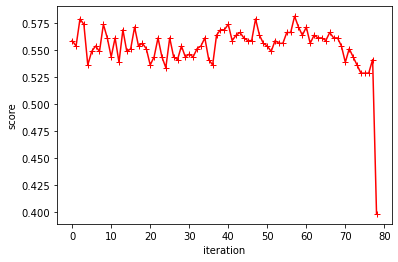

In [38]:
dt_model2 = []
score = []
for i in ccp_alpha:
    dt_m = DecisionTreeClassifier(ccp_alpha = i)
    dt_m.fit(x1,y1)
    dt_model2.append(dt_m)
    score.append(dt_m.score(x_test, y_test))

    
plt.plot(score, 'r-+')
plt.xlabel('iteration')
plt.ylabel('score')

In [39]:
dt_modle2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.0016666666666666668),
 DecisionTreeClassifier(ccp_alpha=0.0018181818181818184),
 DecisionTreeClassifier(ccp_alpha=0.00191304347826087),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002),
 DecisionTreeClassifier(ccp_alpha=0.002033333333333334),
 DecisionTreeClassifier(ccp_alpha=0.002528735632183909),
 DecisionTreeClassifier(ccp_alpha=0.0026111111111111114),
 DecisionTreeClassifier(ccp_alpha=0.0026276923076923083),
 DecisionTreeClassifier(ccp_alpha=0.0026666666666666666),
 DecisionTreeClassifier(ccp_alpha=0.0026666666666666666),
 DecisionTreeClassifier(ccp_alpha=0.0026666666666666666),
 DecisionTreeClassifier(ccp_alpha=0.0026666666666666666),
 DecisionTreeClassifier(ccp_alpha=0.0026666666666666666),
 DecisionTreeClassifier(ccp_a

In [40]:
train_score = [i.score(x1,y1) for i in dt_modle2]

In [41]:
test_score = [i.score(x_test ,y_test) for i in dt_modle2]

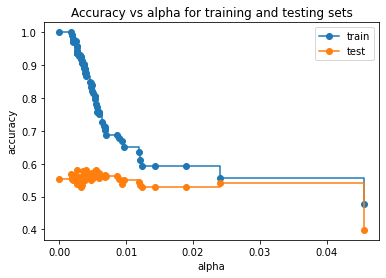

In [42]:
fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alpha, train_score, marker='o', label="train",
        drawstyle="steps-post")
ax.plot(ccp_alpha, test_score, marker='o', label="test",
        drawstyle="steps-post")
ax.legend()
plt.show()

In [43]:
dt_model_ccp = DecisionTreeClassifier(random_state=0 , ccp_alpha=.014)
dt_model_ccp.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.014, random_state=0)

[Text(496.0, 951.3000000000001, 'X[10] <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 15, 239, 184, 53, 8]'),
 Text(248.0, 679.5, 'X[6] <= 62.5\ngini = 0.502\nsamples = 259\nvalue = [1, 11, 167, 73, 6, 1]'),
 Text(124.0, 407.70000000000005, 'gini = 0.576\nsamples = 170\nvalue = [1, 9, 91, 62, 6, 1]'),
 Text(372.0, 407.70000000000005, 'gini = 0.255\nsamples = 89\nvalue = [0, 2, 76, 11, 0, 0]'),
 Text(744.0, 679.5, 'X[9] <= 0.545\ngini = 0.659\nsamples = 241\nvalue = [0, 4, 72, 111, 47, 7]'),
 Text(620.0, 407.70000000000005, 'gini = 0.408\nsamples = 32\nvalue = [0, 2, 24, 5, 1, 0]'),
 Text(868.0, 407.70000000000005, 'X[9] <= 0.705\ngini = 0.64\nsamples = 209\nvalue = [0, 2, 48, 106, 46, 7]'),
 Text(744.0, 135.89999999999998, 'gini = 0.53\nsamples = 100\nvalue = [0, 2, 23, 64, 8, 3]'),
 Text(992.0, 135.89999999999998, 'gini = 0.676\nsamples = 109\nvalue = [0, 0, 25, 42, 38, 4]')]

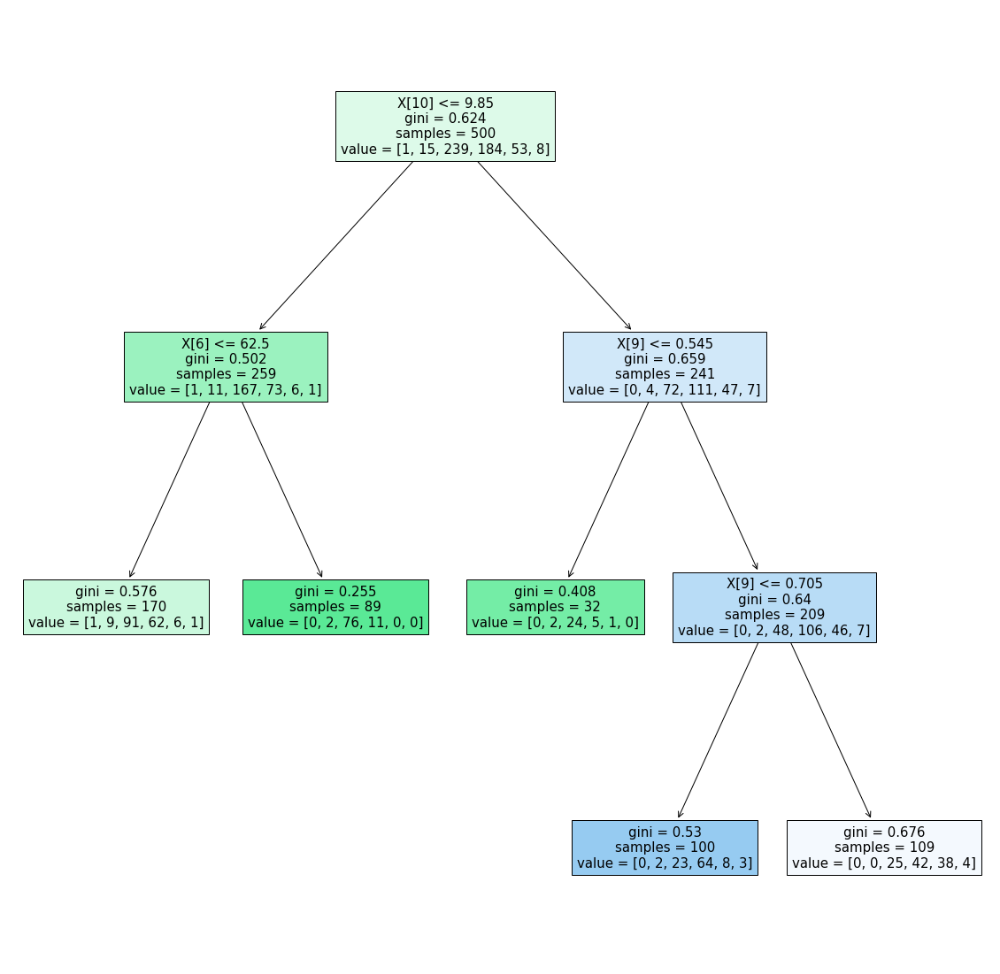

In [44]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp,filled=True)

In [45]:
dt_model_ccp.score(x1,y1)

0.594

In [46]:
dt_model_ccp.score(x_test,y_test)

0.5288220551378446

In [47]:
DecisionTreeClassifier()

DecisionTreeClassifier()

In [48]:
grid_pram = {"criterion":['gini','entropy'],
             "splitter":['best','random'],
             "max_depth" : range(2,40,1),
             "min_samples_split":range(2,10 ,1),
             "min_samples_leaf":range(1,10,1),
             'ccp_alpha':np.random.rand(20)
             }

In [49]:
grid_ccp = GridSearchCV(estimator=dt_model_ccp,param_grid=grid_pram , cv = 10 , n_jobs=-1)

In [ ]:
#grid_ccp.fit(x1,y1)
grid_ccp.fit(x1,y1)

C:\Users\pbann\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:666: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=10.
  warnings.warn(("The least populated class in y has only %d"


In [ ]:
grid_ccp.best_params_

In [ ]:
dt_cpp_new = DecisionTreeClassifier(criterion='entropy' , max_depth=17 ,min_samples_leaf=1 , min_samples_split=3 , splitter='random',ccp_alpha=0.014)

In [110]:
dt_cpp_new.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.014, criterion='entropy', max_depth=17,
                       min_samples_split=3, splitter='random')

In [111]:
dt_cpp_new.score(x1,y1)

0.636

In [112]:
dt_cpp_new.score(x_test,y_test)

0.555

In [117]:
pred = dt_cpp_new.predict(x_train)

In [118]:
confusion_matrix(y_train,pred)

array([[  0,   0,   7,   1,   0,   0],
       [  0,   0,  23,  12,   0,   0],
       [  3,   0, 389, 120,   0,   0],
       [  2,   0, 201, 270,   4,   0],
       [  0,   0,  18, 123,  12,   0],
       [  0,   0,   1,  13,   0,   0]], dtype=int64)